# `Семинар 1.2: Цикл обучение на pytorch`

#### `Сириус, смена "Алгоритмы и анализ данных" 2024`

#### `Оганов Александр, кафедра ММП ВМК МГУ`

#### `За основу взяты материалы Глеба Афанасьева, Максима Нахднова, Варламовой Арины, кафедра ММП ВМК МГУ`

[Источник GitHub](https://github.com/mmp-practicum-team/mmp_practicum_spring_2024/tree/c3205ef68e4e4fcd24fea6947f144dee7f6f7930/Seminars/Seminar%2004)


В данном ноутбуке рассмотрены некоторые аспекты обучения нейросетей с помощью библиотеки PyTorch. Эксперименты проводятся на датасете **[Tiny ImageNet](https://github.com/fastai/imagenette#imagenette-1)**. 

Официальные туториалы pytorch по этим темам:

* [Neural networks](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html#sphx-glr-beginner-blitz-neural-networks-tutorial-py)

* [Training a classifier](https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py)

* [Reproducibilty PyTorch](https://pytorch.org/docs/stable/notes/randomness.html)

* [Training recipe](https://pytorch.org/blog/how-to-train-state-of-the-art-models-using-torchvision-latest-primitives/)

## `Напоминание`

**Вопрос:** что необходимо для решения задачи с помощью нейронной сети?

## `Блоки нейронных сетей`

In [1]:
import torch

In [2]:
torch.cuda.is_available()

True

### `torch.nn.Module`

Для того, чтобы реализовать свой блок, нужно, чтобы он был отнаследован от базового класса для всех нейронных сетей `torch.nn.Module`. 

Затем, для удобства и в соответствии с общепринятой практикой, модуль должен реализовывать функцию `forward`.  В этой функции обычно реализуют основную логику вычислений в модуле, так называемый *прямой проход* через слой. Pytorch использует функцию `forward` для переопределения магического метода класса `__call__`, что позволяет использовать следующий синтаксический сахар для вычисления прямого прохода:
```python
# Два эквивалентных способа делать прямой проход через блок:
out = module(x)
out = module.forward(x)
```

Нужно отметить, что блоки являются лишь удобной обёрткой для вычислений и создания графа автоматического дифференцирования.

Рассмотрим простейший пример модуля, который реализует **Тождественное преобразование**:

In [3]:
class Identity(torch.nn.Module):
    def __init__(self):
        '''
        Конструктор блока. Здесь обычно создают обучаемые параметры и сохраняют переменные, 
            определяющие глобальное состояние слоя, а так же гиперпараметры
        Блок, может содержать в себе подблоки, которые также были отнаследованы от базового класса torch.nn.Module
        '''
        # Необходимо вызвать конструктор базового класса для корректной работы блока
        super().__init__()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        '''
        Функция, реализующая прямой проход через слой. В процессе вычислений создаётся граф вычислений
            сквозь который выполняется автоматическое дифференцирование.
        '''
        return x
    
    def __repr__(self):
        '''
        Хорошей практикой является переопределение строкового представления для блоков
        Обычно, помимо названия класса также выводят гиперпараметры данного экземпляра класса
        '''
        return 'Identity()'

Создадим экземпляр данного слоя и проверим его работу:

In [4]:
identity_layer = Identity()
x = torch.randn([3, 5])

# Обратите внимание, метод __call__ был автоматически переопределён через вызов метода forward
print(x, identity_layer(x), sep='\n')
print(identity_layer, torch.equal(x, identity_layer(x)))

tensor([[-2.1419,  1.2791,  0.3598, -0.9518, -0.3282],
        [ 0.6021,  1.7894,  1.1105,  1.1379, -0.5167],
        [-0.0600,  1.4988,  0.3350, -1.6803, -0.3849]])
tensor([[-2.1419,  1.2791,  0.3598, -0.9518, -0.3282],
        [ 0.6021,  1.7894,  1.1105,  1.1379, -0.5167],
        [-0.0600,  1.4988,  0.3350, -1.6803, -0.3849]])
Identity() True


Блоки-наследники `torch.nn.Module` автоматически сохраняют информацию о своей структуре: параметрах, буферах. Например, можно получить генератор всех параметров в данном блоке (метод `parameters`). Более того, каждый параметр имеет своё уникальное имя (обычно оно совпадает с названием переменной, в которую соответствующий параметр был присвоен). Существуют много разных заранее [готовых блоков](https://pytorch.org/docs/stable/nn.html#module-torch.nn).

#### `Сборка нейронной сети`

Для создания моделей из набора слоёв в **Pytorch** обычно используется следующий иерархический подход. Внутри каждого блока, отнаследованного от `torch.nn.Module`, могут содержаться другие слои, так же отнаследованные от `torch.nn.Module`. Как описывалось ранее, подмодули/параметры/буферы.

Для решения проблемы регистрации списков/словарей модулей **Pytorch** реализует контейнеры с поддержкой автоматической регистрации. Как и для параметров, существует несколько таких контейнеров:
* `torch.nn.ModuleList` — хранит список модулей
* `torch.nn.ModuleDict` — хранит словарь модулей
* `torch.nn.Sequential` — особый контейнер, который хранит список модулей и позволяет последовательно применить модули из списка к объекту, поданному ему на вход

### `Функции потерь`

Функции потерь иногда наследуют от базового класса `torch.nn.Module`, но часто сам слой не включают в нейронную сеть.

### `Оптимизаторы`

Для градиентной оптимизации в **Pytorch** реализовано множество оптимизаторов. 

Большинство оптимизаторов в **Pytorch** отнаследовано от базового класса `torch.optim.Optimizer` и имеют следующий вид:
```python

class OptimizerExample(torch.optim.Optimizer):
    def __init__(self, params, **hyperparameters):
        '''
        Конструктор оптимизатора
        
        :param params: список или генератор обучаемых параметров модели
        :param hyperparameters: различные гиперпараметры оптимизатора, например, темп обучения
        '''
        super().__init__(params, hyperparameters)
    
        
    def step(self, closure=None):
        '''
        Функция, выполняющая шаг оптимизации, используя градиенты, сохранённые в тензорах self.params
        '''
        ...
        
    def zero_grad(self):
        '''
        Функция, очищающая градиенты, сохранённые в тензорах self.params
        '''
        ...
```

Отметим, что оптимизаторы в **Pytorch** обычно не управляют подсчётом градиентов, а лишь используют значения атрибута  `grad` у обучаемых параметров. Это позволяет разделить вычисление функции потерь, вычисление градиентов и сам шаг оптимизации на отдельные компоненты, что делает код более читаемым.

Большинство оптимизаторов поддерживают два способа использования:
1. Упрощённый способ, в котором метод `step` используется после того, как были посчитаны градиенты (например, через вызов `backward`)
2. Подвинутый способ, в котором подсчёт градиентов инкапсулирован в функцию `closure`, которая передаётся в метод `step` единственным параметром.

### `Загрузка и предобработка данных`

Pytorch реализует готовый набор классов и функций для работы с наборами данных. Обычно, при работе с **Pytorch** датасет представляют в виде наследника класса `torch.utils.data.Dataset`:
```python
class DatasetExample(torch.utils.data.Dataset):
    def __init__(self):
        super().__init__()
        
    def __getitem__(self, idx):
        '''
        Возвращает элемент датасета по его индексу
        :param int idx: Номер элемента в датасете
        :returns: Объект из выборки с порядковым номером idx
        '''
        ...
        
    def __len__(self):
        '''
        Опциональный метод, возвращает число элементов в датасете
        '''
        ...
```

# `PyTorch на практике`

**Вопрос:** Какие слои вы знаете?

In [5]:
import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

Для начала создадим свою первую нейросеть для классификации, используя уже готовые блоки из PyTorch

In [6]:
class MyFirstNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()
        
        self.fc_in = nn.Linear(in_features=input_dim, out_features=hidden_dim, bias=True)
        
        self.relu1 = nn.ReLU()
        
        self.fc_hidden = nn.Linear(hidden_dim, hidden_dim, bias=True)
        self.relu2 = nn.ReLU()
        
        self.fc_out = nn.Linear(hidden_dim, num_classes)
    
    def forward(self, x):
        x = self.fc_in(x)
        x = self.relu1(x)
        
        x = self.fc_hidden(x)
        x = self.relu2(x)
        
        return self.fc_out(x)
    
    

In [7]:
input_dim = 64
hidden_dim = 32
num_classes = 2

net = MyFirstNetwork(input_dim, hidden_dim, num_classes)
net

MyFirstNetwork(
  (fc_in): Linear(in_features=64, out_features=32, bias=True)
  (relu1): ReLU()
  (fc_hidden): Linear(in_features=32, out_features=32, bias=True)
  (relu2): ReLU()
  (fc_out): Linear(in_features=32, out_features=2, bias=True)
)

In [8]:
batch = torch.ones((4, input_dim))
batch, net(batch)

(tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1

**Вопрос**: Действительно ли так пишут модели? Какие у вас предположения?

### `Более современная запись`

In [9]:
class MySecondNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()
        
        self.fc_in = nn.Sequential(
                nn.Linear(in_features=input_dim, out_features=hidden_dim, bias=True), 
                nn.ReLU()
            )
        
        self.fc_hidden = nn.Sequential(
                nn.Linear(hidden_dim, hidden_dim, bias=True), 
                nn.ReLU()
            )
        
        self.fc_out = nn.Linear(hidden_dim, num_classes)
    
    def forward(self, x):
        
        x = self.fc_in(x)
        x = self.fc_hidden(x)
        
        return self.fc_out(x)
    
    

In [10]:
MySecondNetwork(input_dim, hidden_dim, num_classes)

MySecondNetwork(
  (fc_in): Sequential(
    (0): Linear(in_features=64, out_features=32, bias=True)
    (1): ReLU()
  )
  (fc_hidden): Sequential(
    (0): Linear(in_features=32, out_features=32, bias=True)
    (1): ReLU()
  )
  (fc_out): Linear(in_features=32, out_features=2, bias=True)
)

**Вопрос**: А если хочется еще больше???

In [11]:
class MyThirdNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes):
        super().__init__()
        
        self.fc_in = nn.Sequential(
                nn.Linear(in_features=input_dim, out_features=hidden_dim, bias=True), 
                nn.ReLU()
            )
        
        self.layers = nn.Sequential(
            *[
                nn.Sequential(nn.Linear(hidden_dim, hidden_dim), nn.ReLU()) 
                for i in range(num_layers)
             ],
        )
        
        self.fc_out = nn.Linear(hidden_dim, num_classes)
    
    def forward(self, x):
        
        x = self.fc_in(x)
        x = self.layers(x)
        
        return self.fc_out(x)
    
    

In [12]:
m1n = MyFirstNetwork(input_dim, hidden_dim=hidden_dim, num_classes=num_classes)
m1n

MyFirstNetwork(
  (fc_in): Linear(in_features=64, out_features=32, bias=True)
  (relu1): ReLU()
  (fc_hidden): Linear(in_features=32, out_features=32, bias=True)
  (relu2): ReLU()
  (fc_out): Linear(in_features=32, out_features=2, bias=True)
)

In [13]:
m2n = MySecondNetwork(input_dim, hidden_dim=hidden_dim, num_classes=num_classes)
m2n

MySecondNetwork(
  (fc_in): Sequential(
    (0): Linear(in_features=64, out_features=32, bias=True)
    (1): ReLU()
  )
  (fc_hidden): Sequential(
    (0): Linear(in_features=32, out_features=32, bias=True)
    (1): ReLU()
  )
  (fc_out): Linear(in_features=32, out_features=2, bias=True)
)

In [14]:
m3n = MyThirdNetwork(input_dim, hidden_dim=hidden_dim, num_layers=5, num_classes=num_classes)
m3n

MyThirdNetwork(
  (fc_in): Sequential(
    (0): Linear(in_features=64, out_features=32, bias=True)
    (1): ReLU()
  )
  (layers): Sequential(
    (0): Sequential(
      (0): Linear(in_features=32, out_features=32, bias=True)
      (1): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=32, out_features=32, bias=True)
      (1): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=32, out_features=32, bias=True)
      (1): ReLU()
    )
    (3): Sequential(
      (0): Linear(in_features=32, out_features=32, bias=True)
      (1): ReLU()
    )
    (4): Sequential(
      (0): Linear(in_features=32, out_features=32, bias=True)
      (1): ReLU()
    )
  )
  (fc_out): Linear(in_features=32, out_features=2, bias=True)
)

Ура! Мы научились делать нейросети, пора переходить к действительно трудным задачам! Или нет?...

Как же выглядят относительно современные нейросети для классификации изображений?

In [15]:
from torchvision.models import resnet18

In [16]:
resnet_model = resnet18()
resnet_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

**Вопрос**: Как примерно оценить вычислительную сложность модели?

Для начала можем посмотреть на количество параметров, что в первом преближении поможет нам оценить сложность. Почему такая характеристика часто далека от правды?

In [17]:
def print_params_count(model):

    total_params = sum(p.numel() for p in model.parameters())
    total_params_grad = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    model_name = model.__class__.__name__
    print(f"Информация о числе параметров модели: {model_name}")
    print(f"Всего параметров: \t\t {total_params}")
    print(f"Всего обучаемых параметров: \t {total_params_grad}")
    print()

In [18]:
print_params_count(m1n)
print_params_count(m2n)
print_params_count(m3n)

print_params_count(resnet_model)

Информация о числе параметров модели: MyFirstNetwork
Всего параметров: 		 3202
Всего обучаемых параметров: 	 3202

Информация о числе параметров модели: MySecondNetwork
Всего параметров: 		 3202
Всего обучаемых параметров: 	 3202

Информация о числе параметров модели: MyThirdNetwork
Всего параметров: 		 7426
Всего обучаемых параметров: 	 7426

Информация о числе параметров модели: ResNet
Всего параметров: 		 11689512
Всего обучаемых параметров: 	 11689512



**Вопрос**: Всегда ли все параметры обучаемы? Какие примеры Вы знаете?

Будем разбираться постепенно и перейдем от линейныйх слоев к сверточным.

# `Сверточные нейронные сети`
## `Теория`

Свертка 2d изображения - аггрегация данных об интенсивности пикселей на изображении в соответствии с определенным набором правил.

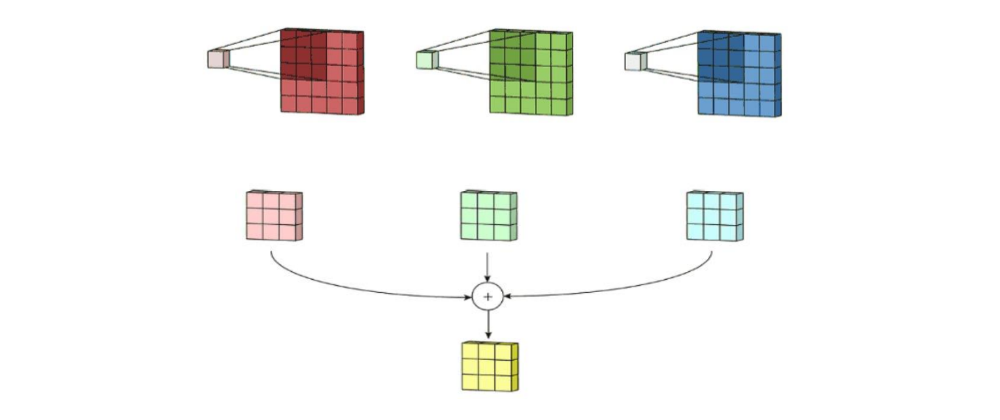

### `Свертка в PyTorch`

In [19]:
?torch.nn.Conv2d

```python
class torch.nn.Conv2d(
    in_channels, out_channels, kernel_size,
    stride=1, padding=0, dilation=1, groups=1,
    bias=True, padding_mode='zeros', device=None,
    dtype=None
)
```

**Stride:**

Определяет шаг, с которым ядро свертки проходит по матрице

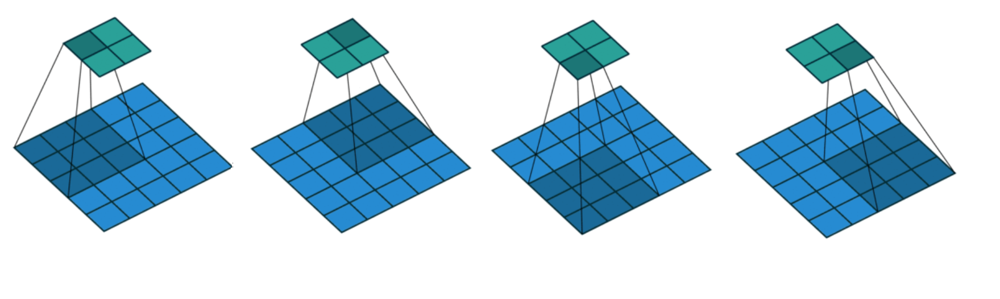

**Padding:**

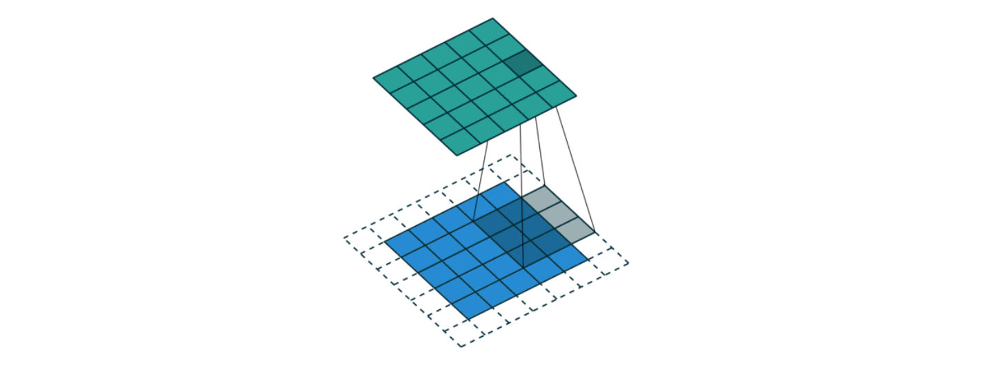

**Dilation:**

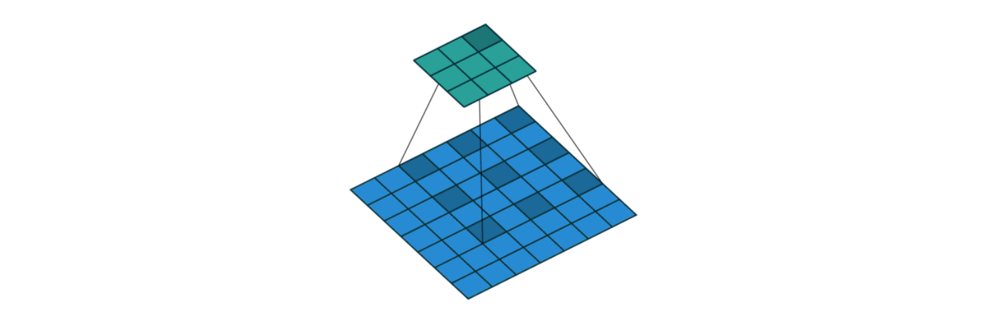

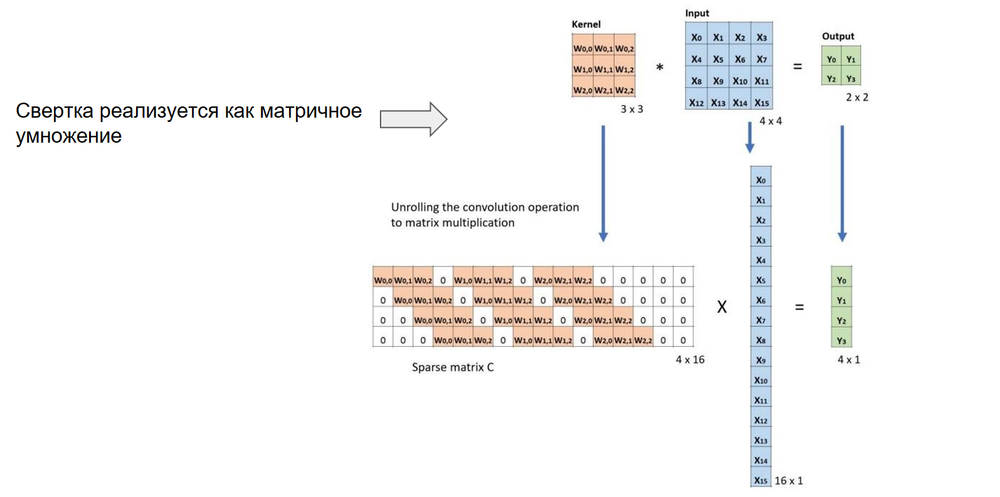

####  `Примеры сверток`

Много примеров было рассмотренно в [осеннем семестре](https://github.com/mmp-practicum-team/mmp_practicum_fall_2023/blob/master/Seminars/04-image-processing-and-KNN/Seminar_4_cv_msu.ipynb)

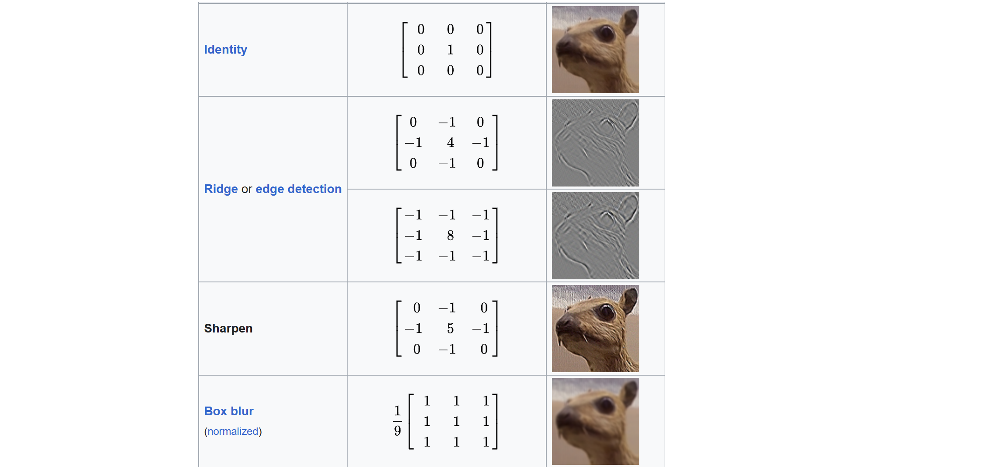

In [20]:
import requests
from io import BytesIO

import numpy as np
from PIL import Image
from PIL import ImageFilter
import matplotlib.pyplot as plt

import torchvision
from torchvision.transforms.functional import pil_to_tensor

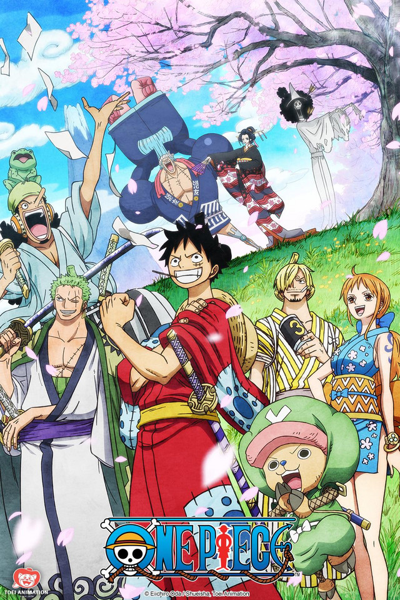

In [21]:
response = requests.get(
    'https://static.wikia.nocookie.net/ani-manga/images/e/e2/One_Piece_Poster.jpg/revision/latest?cb=20210818142325&path-prefix=ru'
)
image = Image.open(BytesIO(response.content))
image = image.resize((400, 600))
image

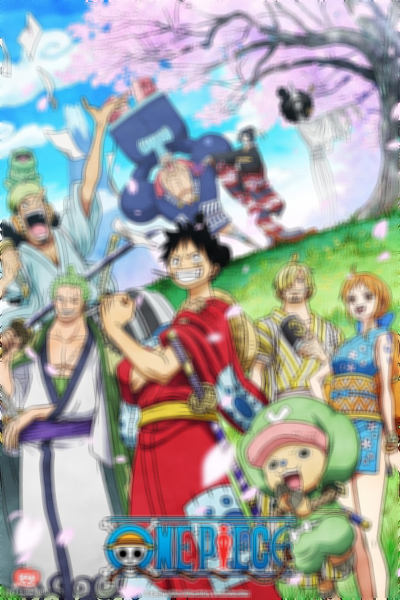

In [22]:
image_01 = image.filter(ImageFilter.BLUR)
image_01


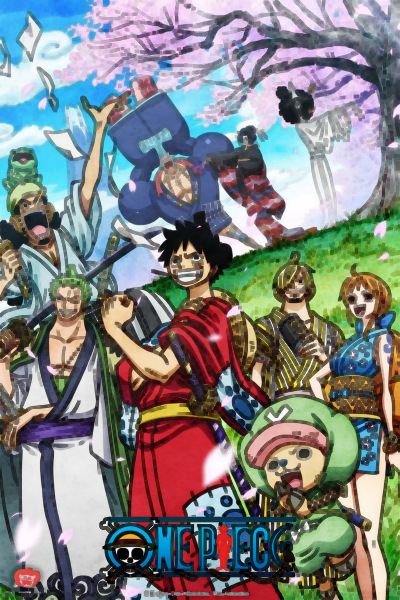

In [23]:
image_02 = image.filter(ImageFilter.MinFilter(3))
image_02

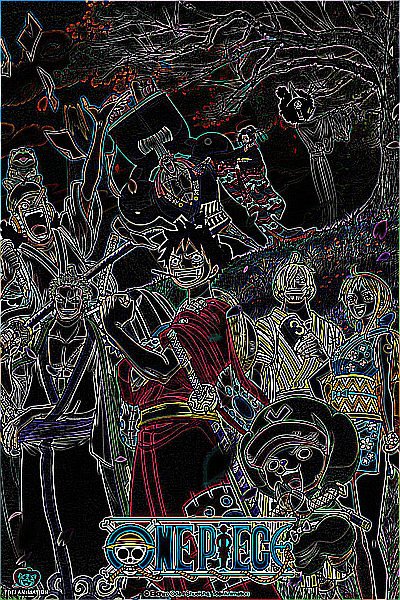

In [24]:
image_03 = image.filter(ImageFilter.FIND_EDGES)
image_03

### `Pooling Layers`

Как увеличить зону покрытия свертки?

*   Dilation
*   Больше сверток
*   Pooling

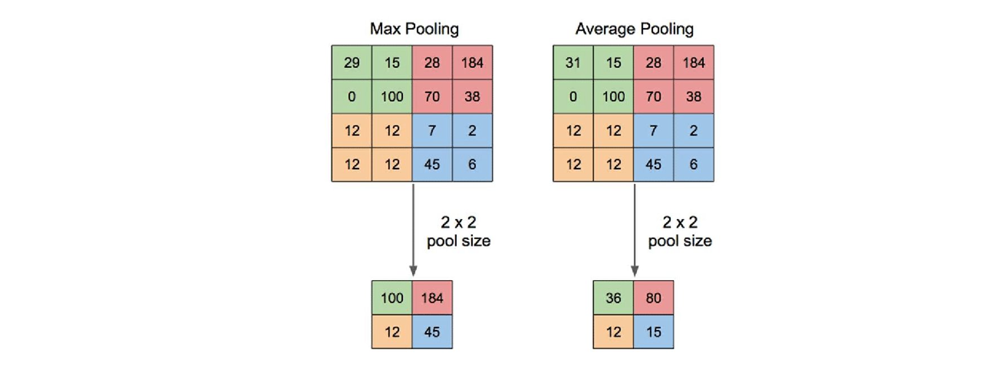

In [25]:
?torch.nn.MaxPool2d

## `Простая схема сверточной сети для классификации`

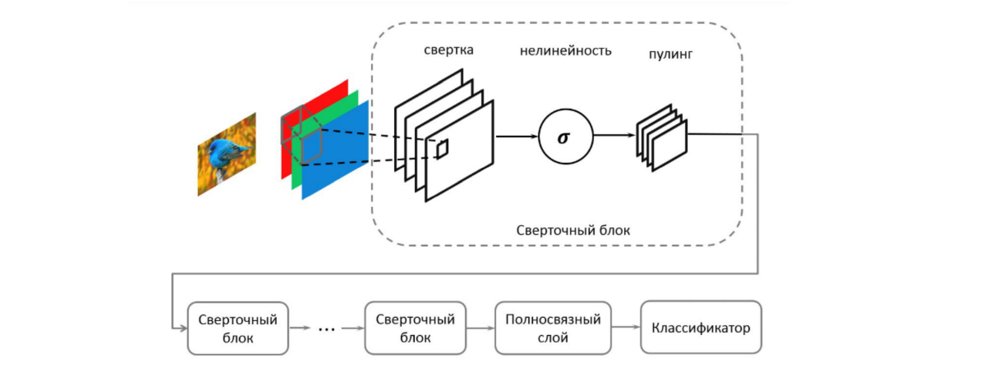

Классические архитектуры сверточных сетей для 
классификации


*   AlexNet
*   VGG
*   Inception
*   ResNet
*   https://pytorch.org/vision/0.8/models.html



### `Аугментация`

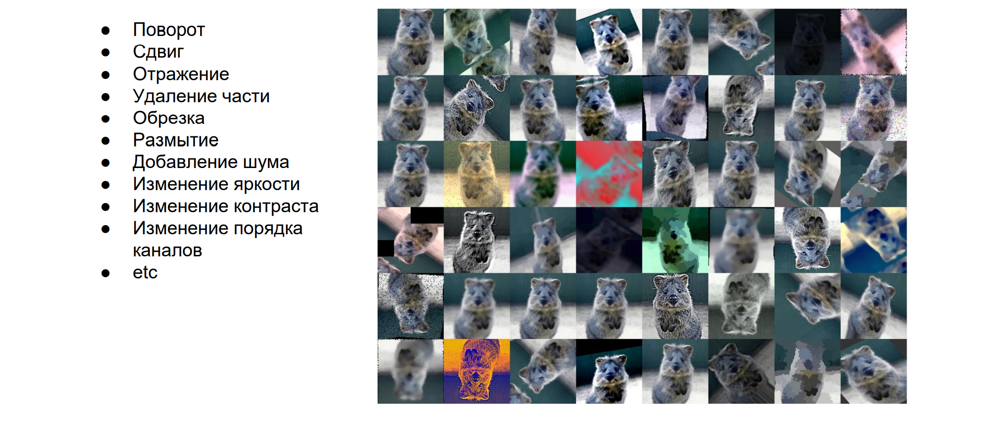

## `Что исследовалось, когда появились сверточные нейросети?`

### `Окклюзия изображений`

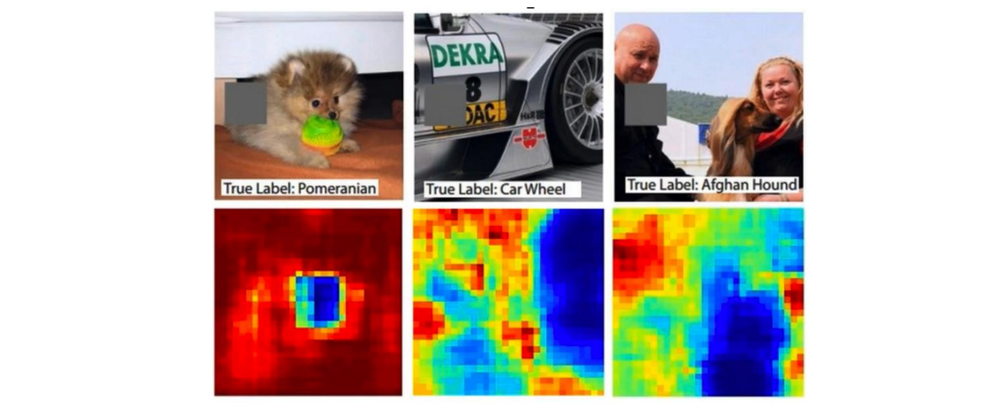

### `Чувствительность фильтров`

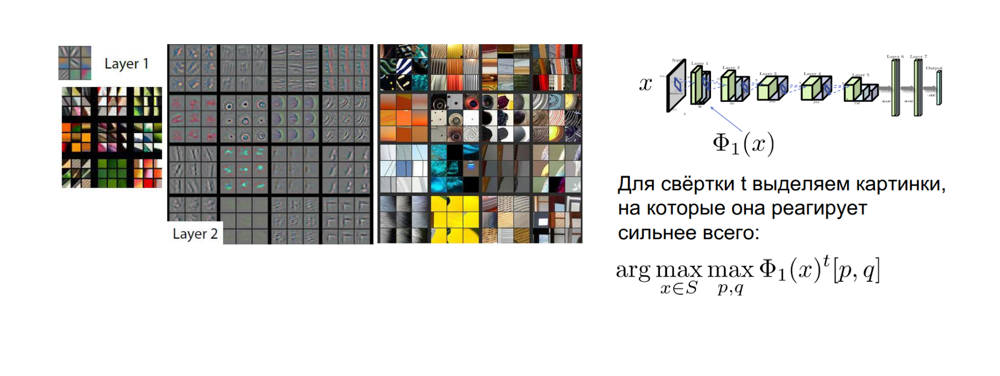

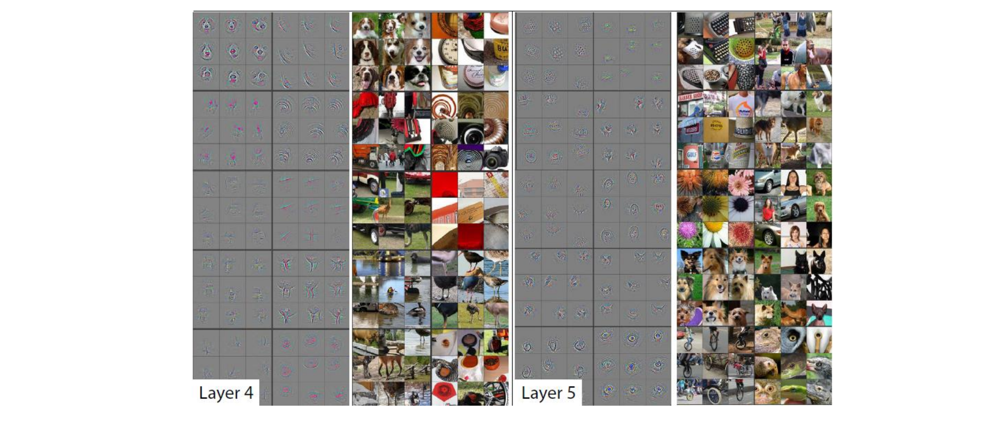

# `Практика`

Рассмотрим датасет `Imagenette`, который состоит из подмножества `ImageNet` и содержит только 10 классов.

`Imagenette` - это подмножество из 10 легко классифицируемых классов `ImageNet` (линь, английский спрингер, кассетный проигрыватель, бензопила, церковь, валторна, мусоровоз, бензонасос, мяч для гольфа, парашют).

[Страница на PyTorch](https://pytorch.org/vision/stable/generated/torchvision.datasets.Imagenette.html#torchvision.datasets.Imagenette)

[Официальный GitHub](https://github.com/fastai/imagenette#imagenette-1)

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder

import os
import random

from PIL import Image
from tqdm import tqdm
import wandb

import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.transforms as transforms

In [27]:
device = "cpu"

if torch.cuda.is_available():
    device = "cuda:0"
    
device

'cuda:0'

In [28]:
DATA_DIR = "./imagenette2-160/"

In [29]:
if not os.path.exists(DATA_DIR):
    
    ! wget https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-160.tgz
    ! tar -xvzf imagenette2-160.tgz

In [30]:
os.listdir(DATA_DIR)

['train', 'noisy_imagenette.csv', 'imagenette2-160', '.DS_Store', 'val']

In [31]:
df = pd.read_csv(os.path.join(DATA_DIR, 'noisy_imagenette.csv'))
df.head()

,path,noisy_labels_0,noisy_labels_1,noisy_labels_5,noisy_labels_25,noisy_labels_50,is_valid
0,train/n02979186/n02979186_9036.JPEG,n02979186,n02979186,n02979186,n02979186,n02979186,False
1,train/n02979186/n02979186_11957.JPEG,n02979186,n02979186,n02979186,n02979186,n03000684,False
2,train/n02979186/n02979186_9715.JPEG,n02979186,n02979186,n02979186,n03417042,n03000684,False
3,train/n02979186/n02979186_21736.JPEG,n02979186,n02979186,n02979186,n02979186,n03417042,False
4,train/n02979186/ILSVRC2012_val_00046953.JPEG,n02979186,n02979186,n02979186,n02979186,n03394916,False


In [32]:
enc = OrdinalEncoder()
labels = df['noisy_labels_0'].values
labels_enc = enc.fit_transform(labels[:, None]).astype('int').ravel()

names, counts = np.unique(labels_enc, return_counts=True)
print("Информация о таргетах")
print("Присутсвтуют классы:", names.tolist())
print("Количество объектов каждого класса:", names.tolist())

df['target'] = labels_enc
df.head()

Информация о таргетах
Присутсвтуют классы: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Количество объектов каждого класса: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


,path,noisy_labels_0,noisy_labels_1,noisy_labels_5,noisy_labels_25,noisy_labels_50,is_valid,target
0,train/n02979186/n02979186_9036.JPEG,n02979186,n02979186,n02979186,n02979186,n02979186,False,2
1,train/n02979186/n02979186_11957.JPEG,n02979186,n02979186,n02979186,n02979186,n03000684,False,2
2,train/n02979186/n02979186_9715.JPEG,n02979186,n02979186,n02979186,n03417042,n03000684,False,2
3,train/n02979186/n02979186_21736.JPEG,n02979186,n02979186,n02979186,n02979186,n03417042,False,2
4,train/n02979186/ILSVRC2012_val_00046953.JPEG,n02979186,n02979186,n02979186,n02979186,n03394916,False,2


In [33]:
df.shape

(13394, 8)

**Задание:** Напишите класс датасета

In [34]:
class ImageDataset(Dataset):
    
    def __init__(self, data, is_train, transform):
        super().__init__()
        mask = data['is_valid'] != is_train
        
        self.img_paths = data[mask].path.values
        self.targets = data[mask].target.values
        
        self.transform = transform
        
    def __getitem__(self, idx):
        path = self.img_paths[idx]
        img = Image.open(os.path.join(DATA_DIR, path)).convert('RGB')
        
        target = self.targets[idx]
        img = self.transform(img)
            
        return img, target
    
    def __len__(self):
        return len(self.img_paths)
        


In [35]:
# Почему разные transform?

transform_train = transforms.Compose([transforms.ToTensor(),
                                      transforms.RandomCrop((160, 160)),
                                      transforms.RandomHorizontalFlip(p=0.5),
                                      transforms.RandomGrayscale(p=0.1)])

transform_test = transforms.Compose([transforms.ToTensor(), transforms.CenterCrop((160, 160))])

In [36]:
train_dataset = ImageDataset(df, is_train=True, transform=transform_train)
valid_dataset = ImageDataset(df, is_train=False, transform=transform_test)
len(train_dataset), len(valid_dataset)

(9469, 3925)

In [37]:
vis_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=False, num_workers=8)

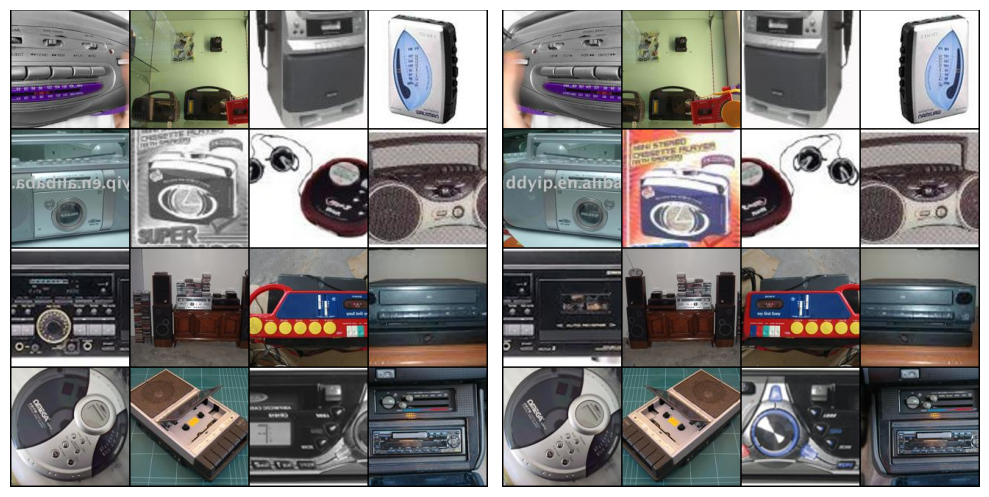

In [38]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

for i in range(2):
    batch = next(iter(vis_dataloader))

    img_grid = torchvision.utils.make_grid(batch[0], nrow=4 )

    ax[i].imshow(img_grid.permute(1, 2, 0).numpy())
    ax[i].axis('off')

plt.tight_layout()

In [39]:
vis_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=8)

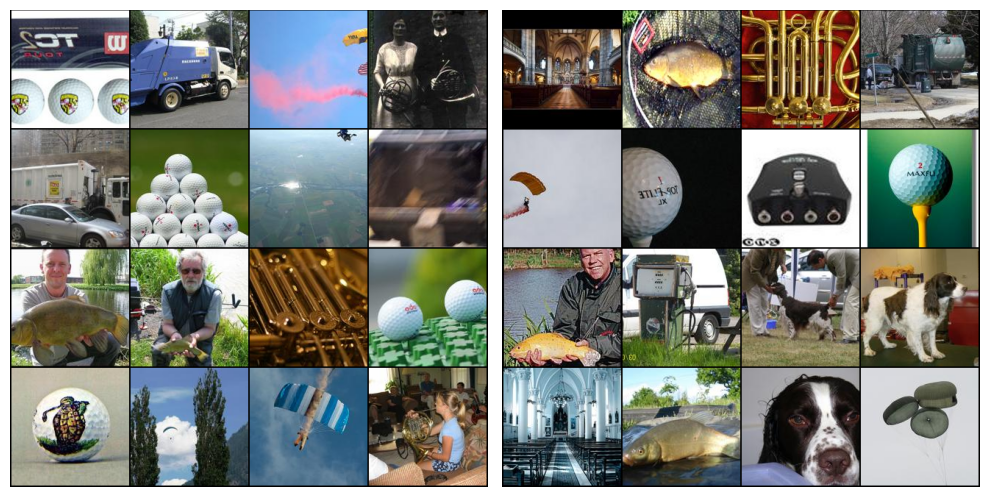

In [40]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

for i in range(2):
    batch = next(iter(vis_dataloader))

    img_grid = torchvision.utils.make_grid(batch[0], nrow=4 )

    ax[i].imshow(img_grid.permute(1, 2, 0).numpy())
    ax[i].axis('off')

plt.tight_layout()

### `LeNet для классификации`

Попробуем использовать для классификации свёрточные сети. Для начала рассмотрим очень простую архитектуру LeNet:

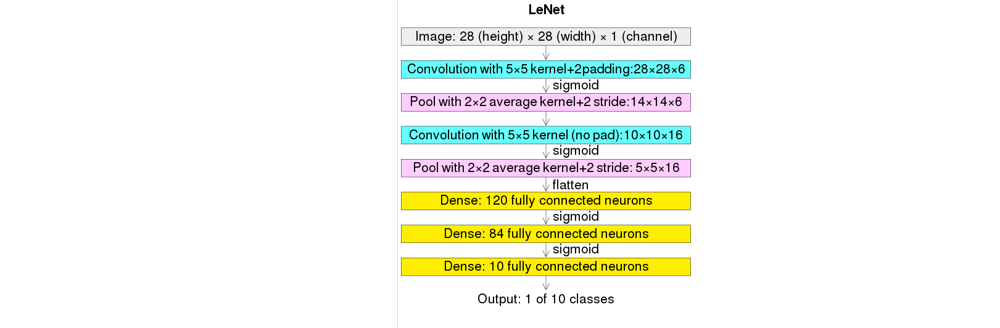

In [41]:
class LeNet(torch.nn.Module):
    def __init__(self, n_classes):
        super().__init__()
        
        self.features = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(5, 5)),
            torch.nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
            torch.nn.ReLU(),
            
            torch.nn.Conv2d(in_channels=6, out_channels=6, kernel_size=(5, 5)),
            torch.nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
            torch.nn.ReLU(),

            torch.nn.Conv2d(in_channels=6, out_channels=16, kernel_size=(5, 5)),
            torch.nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
            torch.nn.ReLU(),
        )
        
        self.dense = torch.nn.Sequential(
            torch.nn.Flatten(),
            torch.nn.Linear(16 * 16 * 16, 120),
            torch.nn.ReLU(),
            torch.nn.Linear(120, 84),
            torch.nn.ReLU(),
            torch.nn.Linear(84, n_classes),
        )

    def forward(self, x):
        return self.dense(self.features(x))

In [42]:
net = LeNet(10)

In [43]:
print_params_count(net)

Информация о числе параметров модели: LeNet
Всего параметров: 		 506432
Всего обучаемых параметров: 	 506432



**Вопрос**: Что осталось определить?

In [44]:
optimizer = optim.Adam(net.parameters(), lr=1e-4)

In [45]:
loss_fn = torch.nn.CrossEntropyLoss()

In [46]:
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=4)
valid_dataloader = DataLoader(valid_dataset, batch_size=4096, shuffle=False, num_workers=4)

**Задание:** Напишите цикл обучения

In [47]:
def train(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device):
    
    
    global_step = 0
    net = net.to(device)
    net.train()
    
    for epoch in tqdm(range(epoch_num)):
        
        for X_batch, y_true in train_dataloader:
            optimizer.zero_grad()
            
            X_batch = X_batch.to(device)
            y_true = y_true.to(device)
            
            out = net(X_batch)
            
            loss = loss_fn(out, y_true)
            loss.backward()
            
            optimizer.step()
            
            y_pred = torch.argmax(out, 1)
            accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]
            print(f"{global_step}, loss = {loss.item():0.3f}, \t accuracy = {accuracy.item():0.4f}")
            
            global_step += 1
            
        
        

In [48]:
# Обучим 1 эпоху, чтобы проверить корректность работы

epoch_num = 1
train(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

  0%|                                                               | 0/1 [00:00<?, ?it/s]

0, loss = 2.301, 	 accuracy = 0.1094
1, loss = 2.305, 	 accuracy = 0.0977
2, loss = 2.298, 	 accuracy = 0.1016
3, loss = 2.304, 	 accuracy = 0.0898
4, loss = 2.299, 	 accuracy = 0.0859
5, loss = 2.306, 	 accuracy = 0.0977
6, loss = 2.305, 	 accuracy = 0.1211
7, loss = 2.305, 	 accuracy = 0.0938
8, loss = 2.303, 	 accuracy = 0.1445
9, loss = 2.301, 	 accuracy = 0.1406
10, loss = 2.304, 	 accuracy = 0.0781
11, loss = 2.311, 	 accuracy = 0.1055
12, loss = 2.307, 	 accuracy = 0.0977
13, loss = 2.301, 	 accuracy = 0.0938
14, loss = 2.296, 	 accuracy = 0.1094
15, loss = 2.310, 	 accuracy = 0.0859
16, loss = 2.301, 	 accuracy = 0.1172
17, loss = 2.304, 	 accuracy = 0.1055
18, loss = 2.310, 	 accuracy = 0.0820
19, loss = 2.305, 	 accuracy = 0.0938
20, loss = 2.308, 	 accuracy = 0.0977
21, loss = 2.293, 	 accuracy = 0.1992
22, loss = 2.306, 	 accuracy = 0.1250
23, loss = 2.302, 	 accuracy = 0.1445
24, loss = 2.292, 	 accuracy = 0.2070
25, loss = 2.301, 	 accuracy = 0.1406
26, loss = 2.295, 	 ac

100%|███████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.99s/it]

34, loss = 2.299, 	 accuracy = 0.1406
35, loss = 2.306, 	 accuracy = 0.1211
36, loss = 2.300, 	 accuracy = 0.1621


**Ура! Мы написали цикл обучения!!!**

Правда... он выглядит плохо... или скорее ужасно


**Вопрос**: Как исправить? Чего не хватает? Какие основные проблемы?

Ответим на первый вопрос сразу - использовать библиотеки для логирования (tensorboard, wandb). В этом ноутбуки мы рассмотрим wandb

На два других вопроса будем отвечать постепенно

### `wandb`

Ниже покажем основные примеры логирования

[Еще больше примеров логирования медиа](https://docs.wandb.ai/guides/track/log/media)

In [49]:
# Иницилизация

wandb.init(project='testing', config={"conf": "testing"})

wandb: Currently logged in as: 3145tttt. Use `wandb login --relogin` to force relogin


**Важно** параметр `step` должен расти монотонно!

In [50]:
# Логирование чисел
wandb.log({"train/loss": 0, "eval/loss": 0}, step=0)

# Логирование изображений
wandb.log({"media/img": wandb.Image(img_grid)}, step=0)

# Логирование гистограм
wandb.log({"media/hist": wandb.Histogram(torch.arange(100) ** 2)}, step=0)


# Логирование графиков
fig = plt.figure(figsize=(6,6))
plt.plot(np.arange(100) ** 2)
plt.title(r"$y = x^2$")

wandb.log({"media/plots": wandb.Image(fig)}, step=0)


# Следующие шаги для визаулизаций
wandb.log({"train/loss": 2, "eval/loss": 1}, step=1)
wandb.log({"media/hist": wandb.Histogram(torch.arange(100) ** 3)}, step=1)


fig = plt.figure(figsize=(6,6))
plt.plot(np.arange(100) ** 3)
plt.title(r"$y = x^3$")

wandb.log({"media/plots": wandb.Image(fig)}, step=1)

# Сравнить в чем отличие
wandb.log({"media/img": wandb.Image(img_grid.permute(1, 2, 0).numpy() / 4)}, step=1)
wandb.log({"media/img": wandb.Image(img_grid / 4)}, step=2)


plt.close('all') # мы не хотим отображать графики в ноутбуке

In [51]:
wandb.finish()

eval/loss,▁█
train/loss,▁█
eval/loss,1
train/loss,2


In [52]:
def train_wandb(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device):
    
    # ДОБАВИЛИ
    wandb.init(project="Imagenette", name="LeNet_base")
    
    global_step = 0
    net = net.to(device)
    
    for epoch in tqdm(range(epoch_num)):
        net.train()
        
        for X_batch, y_true in train_dataloader:
            optimizer.zero_grad()
            
            X_batch = X_batch.to(device)
            y_true = y_true.to(device)
            
            out = net(X_batch)
            
            loss = loss_fn(out, y_true)
            loss.backward()
            
            optimizer.step()
            
            y_pred = torch.argmax(out, 1)
            accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]
            
            # ДОБАВИЛИ
            wandb.log({"train/loss": loss.item(), "train/accuracy": accuracy.item()}, step=global_step)
            
            global_step += 1
    
    # ДОБАВИЛИ
    wandb.finish()

**Вопрос:** Можно ли сразу запустить обучение?

In [53]:
# Например вот так

# epoch_num = 1
# train_wandb(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

In [54]:
net = LeNet(10)
optimizer = optim.Adam(net.parameters(), lr=1e-4)

In [55]:
epoch_num = 10

train_wandb(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

100%|█████████████████████████████████████████████████████| 10/10 [00:36<00:00,  3.63s/it]


train/accuracy,▂▂▁▃▄▄▄▅▄▅▅▅▄▅▆▇▆▇▅▇▅▆▆▇▆▆▅▇▆▇▅▅▇▇▅▆▆█▆▇
train/loss,█████▇▇▇▆▅▄▅▅▅▄▃▃▃▅▃▂▃▂▃▃▃▄▁▃▃▃▃▃▂▃▃▃▁▂▂
train/accuracy,0.39921
train/loss,1.80261


### `Чего-то еще не хваетает...`

Наверно **валидации**!

In [56]:
@torch.no_grad()
def evaluate(net, valid_dataloader, loss_fn, device):
    net.eval()
    loss, accuracy = 0, 0
    count = 0
    for X_batch, y_true in valid_dataloader:
        X_batch = X_batch.to(device)
        y_true = y_true.to(device)

        out = net(X_batch)
        y_pred = torch.argmax(out, 1)
        
        bs = out.shape[0]
        loss += loss_fn(out, y_true).item() * bs
        accuracy += torch.sum(y_pred == y_true).item()
        count += bs
        
    return loss / count, accuracy / count

    

def train_wandb_eval(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device):
    
    wandb.init(project="Imagenette", name="LeNet_eval")
    global_step = 0
    net = net.to(device)
    
    for epoch in tqdm(range(epoch_num)):
        net.train()
        
        for X_batch, y_true in train_dataloader:
            optimizer.zero_grad()
            
            X_batch = X_batch.to(device)
            y_true = y_true.to(device)
            
            out = net(X_batch)
            
            loss = loss_fn(out, y_true)
            loss.backward()
            
            optimizer.step()
            
            y_pred = torch.argmax(out, 1)
            accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]
            
            wandb.log({"train/loss": loss.item(), "train/accuracy": accuracy.item()}, step=global_step)
            
            global_step += 1
        
        # ДОБАВИЛИ
        loss, accuracy = evaluate(net, valid_dataloader, loss_fn, device)
        wandb.log({"eval/loss": loss, "eval/accuracy": accuracy}, step=global_step)
        
    wandb.finish()

In [57]:
net = LeNet(10)
optimizer = optim.Adam(net.parameters(), lr=1e-4)

In [58]:
epoch_num = 10
train_wandb_eval(epoch_num, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

100%|█████████████████████████████████████████████████████| 10/10 [01:22<00:00,  8.30s/it]


eval/accuracy,▁▄▆▆▇▇▇███
eval/loss,█▇▄▃▃▂▂▁▁▁
train/accuracy,▁▁▁▁▁▂▃▄▄▅▅▅▅▆▆▆▆▆▆▆▅▆▆▆▆▆▆▆▆▇▆▆▇▇▆▆█▇▇▇
train/loss,███████▇▇▇▆▆▅▄▄▄▄▃▃▃▃▃▄▃▃▃▄▃▃▂▃▃▃▂▃▂▁▁▂▂
eval/accuracy,0.35236
eval/loss,1.84706
train/accuracy,0.39526
train/loss,1.7486


### `Что можно еще улучшить?`

- Дополнительные логи?
- Более аккуратное обучение?

Для начала постараемся сделать обучение независимым от очередности запуска, воспользуемся советами из официальной статьи [Reproducibilty PyTorch](https://pytorch.org/docs/stable/notes/randomness.html)

In [64]:
def set_global_seed(seed: int) -> None:
    """
    Set global seed for reproducibility.
    """
    

    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
#     torch.use_deterministic_algorithms(True) # если нужно гарантировать 1000% воспроизводимость

    # Для Dataloader
    g = torch.Generator()
    g.manual_seed(seed)
    
    return g

# Для каждого woerker в Daaloader
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)


In [65]:
def train_progress(config, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device):
    
    # ДОБАВИЛИ 
    wandb.init(project="Imagenette", name=config['name'], config=config)
    global_step = 0
    net = net.to(device)
    
    epoch_num = config['epoch_num']
    for epoch in tqdm(range(epoch_num)):
        net.train()
        
        for X_batch, y_true in train_dataloader:
            optimizer.zero_grad()
            
            X_batch = X_batch.to(device)
            y_true = y_true.to(device)
            
            out = net(X_batch)
            
            loss = loss_fn(out, y_true)
            loss.backward()
            
            
            optimizer.step()
            
            y_pred = torch.argmax(out, 1)
            accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]
            
            wandb.log({"train/loss": loss.item(), "train/accuracy": accuracy.item()}, step=global_step)
            
            global_step += 1
        
        loss, accuracy = evaluate(net, valid_dataloader, loss_fn, device)
        wandb.log({"eval/loss": loss, "eval/accuracy": accuracy}, step=global_step)
        
    wandb.finish()

In [66]:
# ДОБАВИЛИ
config = {"seed": 42, "lr": 1e-4, "epoch_num": 10, 'batch_size': 256,
         'name': 'LeNet_progress'}

g = set_global_seed(config['seed'])

train_dataloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, 
                               num_workers=4, worker_init_fn=seed_worker, generator=g)

valid_dataloader = DataLoader(valid_dataset, batch_size=4096, shuffle=False, num_workers=4)


# Почему здесь?
net = LeNet(10)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

In [67]:
train_progress(config, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

100%|█████████████████████████████████████████████████████| 10/10 [01:29<00:00,  8.95s/it]


eval/accuracy,▁▄▅▆▇▇▇███
eval/loss,█▇▅▄▃▂▂▁▁▁
train/accuracy,▁▂▁▂▂▁▄▄▄▄▅▆▆▆▆▇▇▅▇▇█▇█▇▆█▆▆▇█▇█▇▇███▇▇▆
train/loss,███████▇▇▇▆▅▅▅▅▃▃▄▃▄▃▂▂▃▃▂▃▃▂▂▂▁▂▂▁▂▁▂▃▂
eval/accuracy,0.35312
eval/loss,1.83959
train/accuracy,0.33202
train/loss,1.84864


### `Кажется, мы готовы! Вот бы ещё чекпоинтов добавить`

In [68]:
def train_final(config, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device):
    
    
    wandb.init(project="Imagenette", name=config['name'], config=config)
    global_step = 0
    
    # ДОБАВИЛИ
    best_accuracy = 0
    os.makedirs(config['checkpoint_dir'], exist_ok=True)
    
    net = net.to(device)
    
    epoch_num = config['epoch_num']
    for epoch in tqdm(range(epoch_num)):
        net.train()
        
        for X_batch, y_true in train_dataloader:
            optimizer.zero_grad()
            
            X_batch = X_batch.to(device)
            y_true = y_true.to(device)
            
            out = net(X_batch)
            
            loss = loss_fn(out, y_true)
            loss.backward()
            
            optimizer.step()
            
            y_pred = torch.argmax(out, 1)
            accuracy = torch.sum(y_pred == y_true) / y_pred.shape[0]
            
            wandb.log({"train/loss": loss.item(), "train/accuracy": accuracy.item()}, step=global_step)
            
            global_step += 1
        
        loss, accuracy = evaluate(net, valid_dataloader, loss_fn, device)
        wandb.log({"eval/loss": loss, "eval/accuracy": accuracy}, step=global_step)
        
        # ДОБАВИЛИ
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            torch.save({
                'epoch': epoch,
                'iter': global_step,
                'model_state_dict': net.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': loss,
                'metric': accuracy
                }, os.path.join(config['checkpoint_dir'], config['checkpoint_name']))
        
    wandb.finish()

In [69]:
config = {"seed": 42, "lr": 1e-4, "epoch_num": 30, 'batch_size': 256,
          'name': 'LeNet_final', "checkpoint_dir": "./checkpoints", "checkpoint_name": "LeNet.pth"}


g = set_global_seed(config['seed'])

train_dataloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, 
                               num_workers=4, worker_init_fn=seed_worker, generator=g)

valid_dataloader = DataLoader(valid_dataset, batch_size=4096, shuffle=False, num_workers=4)

net = LeNet(10)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

In [70]:
train_final(config, net, optimizer, loss_fn, train_dataloader, valid_dataloader, device)

100%|█████████████████████████████████████████████████████| 30/30 [04:31<00:00,  9.05s/it]


eval/accuracy,▁▄▄▅▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇█████████
eval/loss,█▇▆▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
train/accuracy,▁▁▃▄▄▆▄▇▆▅▆▇▆▅▆▆▇▆▆█▇▆▇▇▇▇▇▇▆▆█▇▆▇▇█▆▇██
train/loss,███▆▆▅▅▄▄▄▃▃▃▄▃▄▃▃▃▂▂▃▃▃▂▂▃▃▂▄▂▃▃▂▂▂▃▃▁▂
eval/accuracy,0.41834
eval/loss,1.673
train/accuracy,0.39526
train/loss,1.77179


### `Итог: accuracy на валидации - 0.418`

LeNet — очень простая архитектура. Если мы хотим получить хорошее качество, нужно использовать что-то посложнее (например, взять модель из torchvision.models), а также использовать аугментацию данных. Другой путь улучшения результата — использование предобученной сети и дообучение линейного слоя.

